# <h1>COMP2445 - Data Mining Assignment 2: 22005736<h1>

<strong>This dataset addresses the lack of public botnet datasets, especially for the IoT. It suggests *real* traffic data, gathered from 9 commercial IoT devices authentically infected by Mirai and BASHLITE.<strong>

<p>I found this data on the <a href='https://archive.ics.uci.edu/datasets?Task=Clustering&skip=0&take=10&sort=desc&orderBy=NumHits&search='>UCI Machine Learning Repository.</a>

Number of variables –> attributes = 115
Number of rows -> instances - 7,062,606.
This is a categorical dataset, using clustering.
There are no missing values per variable.

In [2]:
import numpy as np
import pandas as pd

# Import Matplotlib
import matplotlib as mpl
# Import pyplot
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns 
import statistics
from scipy import stats
import scipy.cluster.hierarchy as shc

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
#Performance Metrics
from sklearn.metrics import silhouette_score

ModuleNotFoundError: No module named 'sklearn'

# Attribute Information:
	-- The following describes each of the features headers:
		-- Stream aggregation:
			H: ("Source IP" in N-BaIoT paper) Stats summarizing the recent traffic from this packet's host (IP)
			MI: ("Source MAC-IP" in N-BaIoT paper) Stats summarizing the recent traffic from this packet's host (IP + MAC)
			HH: ("Channel" in N-BaIoT paper) Stats summarizing the recent traffic going from this packet's host (IP) to the packet's destination host.
			HH_jit: ("Channel jitter" in N-BaIoT paper) Stats summarizing the jitter of the traffic going from this packet's host (IP) to the packet's destination host.
			HpHp: ("Socket" in N-BaIoT paper) Stats summarizing the recent traffic going from this packet's host+port (IP) to the packet's destination host+port. Example 192.168.4.2:1242 -> 192.168.4.12:80
		-- Time-frame (The decay factor Lambda used in the damped window): 
			-- How much recent history of the stream is capture in these statistics
			-- L5, L3, L1, L0.1 and L0.01
		-- The statistics extracted from the packet stream:
			weight: The weight of the stream (can be viewed as the number of items observed in recent history)
			mean: ...
			std: ...
			radius: The root squared sum of the two streams' variances
			magnitude: The root squared sum of the two streams' means 
			cov: An approximated covariance between two streams
			pcc: An approximated correlation coefficient between two streams

# Exploratory Data Analysis

In [3]:
#Ecombee Thermostat
et = pd.read_csv("Detection of IOT Botnet Attacks/Ecobee_Thermostat/benign_traffic.csv")
et

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.1_radius,HpHp_L0.1_covariance,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc
0,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,0.000000e+00,0.000000e+00,0.000000,1.000000,60.000000,0.000000e+00,60.000000,0.000000e+00,0.000000e+00,0.000000e+00
1,1.000000,110.000000,0.000000,1.000000,110.000000,0.000000,1.000000,110.000000,0.000000,1.000000,...,1.020000e-07,0.000000e+00,0.000000,1.238636,106.146795,7.887770e+00,106.146795,6.221691e+01,0.000000e+00,0.000000e+00
2,1.724055,91.439104,249.441812,1.823878,92.454965,253.612868,1.937463,93.483558,255.733288,1.993563,...,0.000000e+00,0.000000e+00,0.000000,1.000000,78.000000,0.000000e+00,78.000000,0.000000e+00,0.000000e+00,0.000000e+00
3,1.000000,342.000000,0.000000,1.000000,342.000000,0.000000,1.000000,342.000000,0.000000,1.000000,...,2.740000e-07,0.000000e+00,0.000000,2.487473,341.959189,7.347919e+00,341.959189,5.399191e+01,0.000000e+00,0.000000e+00
4,2.516815,90.867308,150.827639,2.688981,91.541993,160.705060,2.888469,92.277536,169.944112,2.988463,...,9.999797e+01,0.000000e+00,0.000000,2.237519,98.930412,9.942635e+00,98.930412,9.885598e+01,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13108,1.021632,72.648557,2043.443501,1.100243,94.608573,8164.641469,1.464535,165.597474,21353.949970,2.011981,...,2.607515e+04,-1.622480e+03,-0.184540,8.631370,275.101729,2.207153e+02,374.849170,5.482214e+04,-1.052207e+04,-3.006347e-01
13109,1.000000,60.000003,0.000586,1.000123,60.004265,1.153803,1.070600,66.963562,2095.016790,2.485711,...,9.090000e-13,1.970000e-34,0.000000,2.973931,60.000000,6.740000e-07,84.852814,6.430000e-13,-5.290000e-30,-1.160000e-17
13110,1.000000,110.000000,0.000000,1.000000,110.000000,0.000000,1.000000,110.000000,0.000000,1.000000,...,0.000000e+00,0.000000e+00,0.000000,1.108959,110.000000,1.350000e-06,110.000000,1.820000e-12,0.000000e+00,0.000000e+00
13111,1.000000,380.000000,0.000000,1.000000,380.000000,0.000000,1.000005,379.998500,0.480112,1.386152,...,2.474360e+04,-8.042502e+02,-0.097324,8.847831,252.859322,1.523805e+02,364.364810,3.558347e+04,-3.235739e+03,-1.293174e-01


In [4]:
et.describe()

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.1_radius,HpHp_L0.1_covariance,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc
count,13113.000000,13113.000000,13113.000000,13113.000000,13113.000000,13113.000000,13113.000000,13113.000000,13113.000000,13113.000000,...,1.311300e+04,1.311300e+04,13113.000000,13113.000000,13113.000000,13113.000000,13113.000000,1.311300e+04,13113.000000,13113.000000
mean,1.143693,207.558777,6347.444780,1.237423,215.447437,8247.564185,1.495936,229.725019,11186.886485,2.561774,...,1.991946e+04,-2.185876e+03,-0.095595,7.482557,196.888164,115.331205,293.124946,3.133270e+04,-2987.055998,-0.094352
std,0.240561,147.073074,13270.956252,0.344167,140.564282,15461.799362,0.625399,128.676918,16304.208130,1.326598,...,2.815120e+04,4.696020e+03,0.176809,3.659873,88.153201,79.964031,142.438909,3.029417e+04,5020.331327,0.141092
min,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,0.000000e+00,-4.005854e+04,-1.010724,1.000000,60.000000,0.000000,60.000000,0.000000e+00,-39463.345860,-0.690911
25%,1.000000,67.260967,0.000000,1.000000,76.863969,0.000000,1.000000,110.000000,0.002310,1.533641,...,1.020000e-12,-1.493373e+03,-0.144148,3.109186,95.866938,0.000001,96.857099,1.820000e-12,-5043.948599,-0.185178
50%,1.000002,143.369009,0.003028,1.000400,173.945624,3.637611,1.146569,207.516344,2284.841419,2.424449,...,2.166666e+04,-2.281024e-01,-0.000647,8.650998,240.705657,153.390362,367.783583,3.445461e+04,-836.545275,-0.030725
75%,1.255613,380.000000,12421.740450,1.459779,379.999996,18596.581500,1.807384,379.589658,21701.924530,3.223457,...,2.736170e+04,1.470000e-51,0.000000,10.138847,257.096398,165.290205,390.436727,4.201832e+04,0.000000,0.000000
max,4.311646,1108.154953,272101.712800,4.660031,1090.333261,269315.913000,7.895283,940.451256,241627.942700,16.276783,...,3.906840e+05,3.384711e+04,0.863180,23.121981,590.000000,321.653614,681.956010,3.641805e+05,26797.441690,0.535293


In [5]:
et = et[["MI_dir_L5_weight","MI_dir_L5_mean","MI_dir_L3_weight","MI_dir_L3_mean","MI_dir_L1_weight","MI_dir_L1_mean","MI_dir_L1_variance","MI_dir_L0.1_weight","H_L5_mean", "H_L3_mean", "H_L1_mean","HpHp_L0.1_pcc","HpHp_L0.01_weight","HpHp_L0.01_mean","HpHp_L0.01_magnitude"]]

In [6]:
et.dtypes

MI_dir_L5_weight        float64
MI_dir_L5_mean          float64
MI_dir_L3_weight        float64
MI_dir_L3_mean          float64
MI_dir_L1_weight        float64
MI_dir_L1_mean          float64
MI_dir_L1_variance      float64
MI_dir_L0.1_weight      float64
H_L5_mean               float64
H_L3_mean               float64
H_L1_mean               float64
HpHp_L0.1_pcc           float64
HpHp_L0.01_weight       float64
HpHp_L0.01_mean         float64
HpHp_L0.01_magnitude    float64
dtype: object

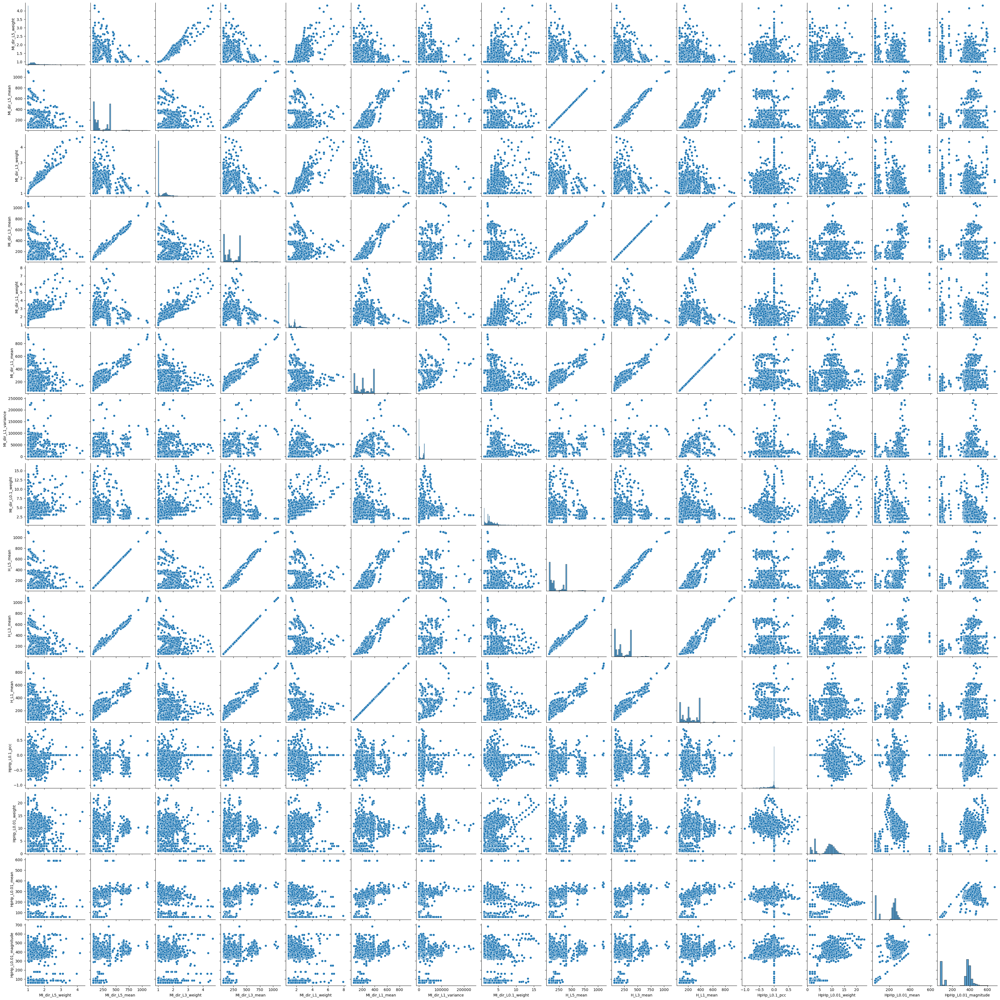

In [7]:
sns.pairplot(et)

In [8]:
et.mode()

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,H_L5_mean,H_L3_mean,H_L1_mean,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_magnitude
0,1.0,380.0,1.0,380.0,1.0,380.0,0.0,1.0,380.0,380.0,380.0,0.0,1.0,60.0,84.852814


In [9]:
z = np.abs(stats.zscore(et))
print(z)

       MI_dir_L5_weight  MI_dir_L5_mean  MI_dir_L3_weight  MI_dir_L3_mean  \
0              0.597349        1.003341          0.689873        1.105924   
1              0.597349        0.663361          0.689873        0.750201   
2              2.412625        0.789567          1.704047        0.875024   
3              0.597349        0.914147          0.689873        0.900352   
4              5.708218        0.793455          4.217755        0.881520   
...                 ...             ...               ...             ...   
13108          0.507424        0.917336          0.398599        0.859703   
13109          0.597348        1.003341          0.689515        1.105893   
13110          0.597349        0.663361          0.689873        0.750201   
13111          0.597349        1.172531          0.689873        1.170702   
13112          0.918084        0.392153          0.896093        0.274449   

       MI_dir_L1_weight  MI_dir_L1_mean  MI_dir_L1_variance  \
0           

In [10]:
threshold = 1
print(np.where(z > threshold))

(array([    0,     0,     0, ..., 13111, 13111, 13111], dtype=int64), array([ 1,  3,  5, ...,  8,  9, 10], dtype=int64))


In [11]:
et_clean = et[(z < threshold).all(axis=1)]

In [12]:
print(et.shape)
print(et_clean.shape)

(13113, 15)
(1758, 15)


In [13]:
et_clean.corr() #Shows the correlation between variables in numbers

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,H_L5_mean,H_L3_mean,H_L1_mean,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_magnitude
MI_dir_L5_weight,1.000000,0.224057,0.981010,0.280874,0.861923,0.214245,0.103844,0.063845,0.224057,0.280874,0.214245,-0.043635,0.001958,0.017191,-0.022589
MI_dir_L5_mean,0.224057,1.000000,0.265224,0.994222,0.326681,0.983450,-0.886569,0.322413,1.000000,0.994222,0.983450,0.051511,-0.073079,0.707663,-0.203282
MI_dir_L3_weight,0.981010,0.265224,1.000000,0.331814,0.931532,0.266329,0.089144,0.078664,0.265224,0.331814,0.266329,-0.033352,-0.004587,0.045079,-0.026243
MI_dir_L3_mean,0.280874,0.994222,0.331814,1.000000,0.392204,0.991266,-0.866558,0.308277,0.994222,1.000000,0.991266,0.046608,-0.075815,0.697992,-0.205792
MI_dir_L1_weight,0.861923,0.326681,0.931532,0.392204,1.000000,0.321016,0.062998,0.188999,0.326681,0.392204,0.321016,-0.020431,0.012997,0.092475,-0.014206
MI_dir_L1_mean,0.214245,0.983450,0.266329,0.991266,0.321016,1.000000,-0.910032,0.276773,0.983450,0.991266,1.000000,0.044537,-0.084584,0.710112,-0.216893
MI_dir_L1_variance,0.103844,-0.886569,0.089144,-0.866558,0.062998,-0.910032,1.000000,-0.226486,-0.886569,-0.866558,-0.910032,-0.044848,0.092205,-0.700889,0.219072
MI_dir_L0.1_weight,0.063845,0.322413,0.078664,0.308277,0.188999,0.276773,-0.226486,1.000000,0.322413,0.308277,0.276773,-0.427773,0.372381,0.202337,-0.038541
H_L5_mean,0.224057,1.000000,0.265224,0.994222,0.326681,0.983450,-0.886569,0.322413,1.000000,0.994222,0.983450,0.051511,-0.073079,0.707663,-0.203282
H_L3_mean,0.280874,0.994222,0.331814,1.000000,0.392204,0.991266,-0.866558,0.308277,0.994222,1.000000,0.991266,0.046608,-0.075815,0.697992,-0.205792


<Axes: >

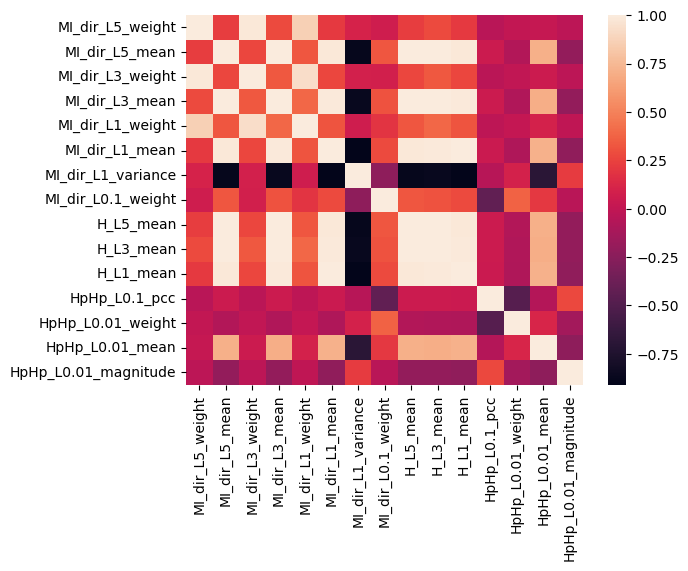

In [14]:
sns.heatmap(et_clean.corr())

{'whiskers': [<matplotlib.lines.Line2D at 0x285de080520>,
 'caps': [<matplotlib.lines.Line2D at 0x285de108970>,
 'boxes': [<matplotlib.lines.Line2D at 0x285de082140>],
 'medians': [<matplotlib.lines.Line2D at 0x285de1099f0>],
 'fliers': [<matplotlib.lines.Line2D at 0x285de109c90>],
 'means': []}

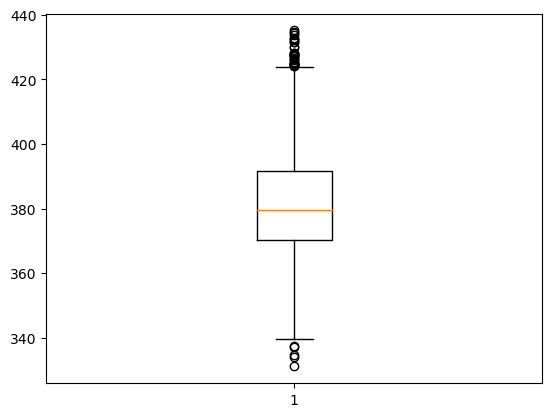

In [15]:
plt.boxplot(et_clean["HpHp_L0.01_magnitude"])

{'whiskers': [<matplotlib.lines.Line2D at 0x285de42ace0>,
 'caps': [<matplotlib.lines.Line2D at 0x285de42b220>,
 'boxes': [<matplotlib.lines.Line2D at 0x285de42aa40>],
 'medians': [<matplotlib.lines.Line2D at 0x285de42b760>],
 'fliers': [<matplotlib.lines.Line2D at 0x285de42ba00>],
 'means': []}

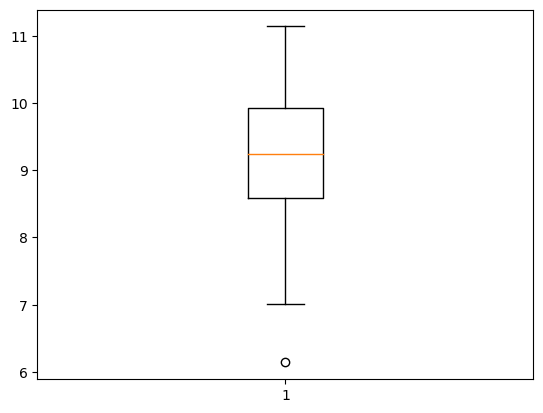

In [16]:
plt.boxplot(et_clean["HpHp_L0.01_weight"])

{'whiskers': [<matplotlib.lines.Line2D at 0x285de4b8df0>,
 'caps': [<matplotlib.lines.Line2D at 0x285de4b91e0>,
 'boxes': [<matplotlib.lines.Line2D at 0x285de4b8b50>],
 'medians': [<matplotlib.lines.Line2D at 0x285de4b9750>],
 'fliers': [<matplotlib.lines.Line2D at 0x285de4b99f0>],
 'means': []}

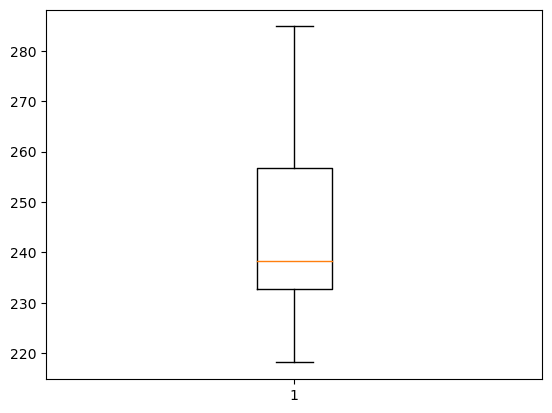

In [17]:
plt.boxplot(et_clean["HpHp_L0.01_mean"])

{'whiskers': [<matplotlib.lines.Line2D at 0x285daa29810>,
 'caps': [<matplotlib.lines.Line2D at 0x285da6a46a0>,
 'boxes': [<matplotlib.lines.Line2D at 0x285daa29240>],
 'medians': [<matplotlib.lines.Line2D at 0x285d5933250>],
 'fliers': [<matplotlib.lines.Line2D at 0x285d5931a20>],
 'means': []}

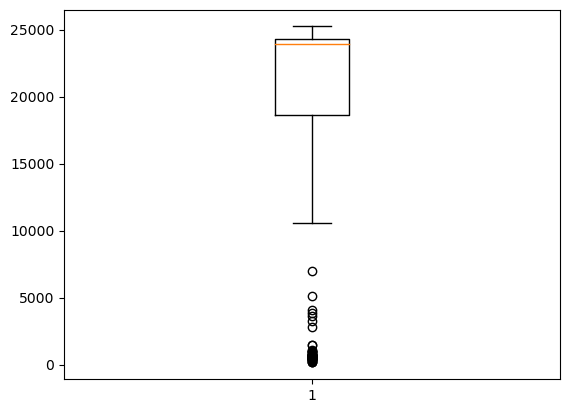

In [18]:
plt.boxplot(et_clean["MI_dir_L1_variance"])

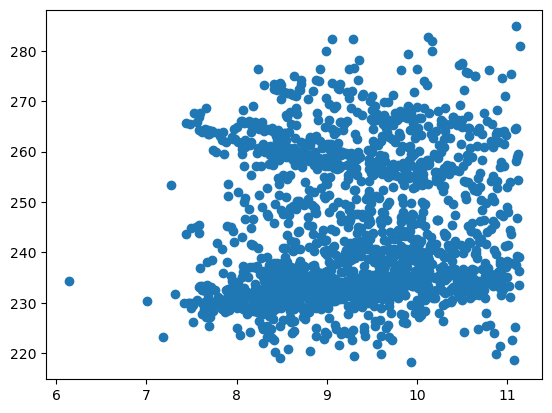

In [19]:
#Scatter plot creation
S = et_clean[['HpHp_L0.01_weight','HpHp_L0.01_mean']]
plt.scatter(S['HpHp_L0.01_weight'],S['HpHp_L0.01_mean'])

In [20]:
from sklearn.preprocessing import normalize
et_scaled = normalize(et)
et_scaled = pd.DataFrame(et_scaled, columns=et.columns)
et_scaled.head()

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,H_L5_mean,H_L3_mean,H_L1_mean,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_magnitude
0,0.005892,0.353523,0.005892,0.353523,0.005892,0.353523,0.000000,0.005892,0.353523,0.353523,0.353523,0.0,0.005892,0.353523,0.353523
1,0.003242,0.356625,0.003242,0.356625,0.003242,0.356625,0.000000,0.003242,0.356625,0.356625,0.356625,0.0,0.004016,0.344133,0.344133
2,0.004802,0.254707,0.005080,0.257537,0.005397,0.260402,0.712355,0.005553,0.254707,0.257537,0.260402,0.0,0.002786,0.217272,0.217272
3,0.001034,0.353562,0.001034,0.353562,0.001034,0.353562,0.000000,0.001034,0.353562,0.353562,0.353562,0.0,0.002572,0.353520,0.353520
4,0.008007,0.289094,0.008555,0.291241,0.009190,0.293581,0.540677,0.009508,0.289094,0.291241,0.293581,0.0,0.007119,0.314747,0.314747


In [21]:
#Ennio Doorbell
ed = pd.read_csv("Detection of IOT Botnet Attacks/Ennio_Doorbell/benign_traffic.csv")
ed

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.1_radius,HpHp_L0.1_covariance,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc
0,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000,60.000000,0.000000e+00,60.000000,0.000000e+00,0.000000e+00,0.00000
1,1.000000,70.000000,0.000000e+00,1.000000,70.000000,0.000000e+00,1.000000,70.000000,0.000000e+00,1.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000,70.000000,0.000000e+00,70.000000,0.000000e+00,0.000000e+00,0.00000
2,1.000023,89.999548,9.039795e-03,1.001631,89.967432,6.503024e-01,1.117713,87.893685,3.768974e+01,1.807388,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000,90.000000,0.000000e+00,90.000000,0.000000e+00,0.000000e+00,0.00000
3,1.000000,60.000000,0.000000e+00,1.000000,60.000000,4.550000e-13,1.000091,60.000000,4.550000e-13,1.394277,...,9.090000e-13,0.000000e+00,0.000000e+00,1.911130,60.000000,9.540000e-07,60.000000,9.090000e-13,0.000000e+00,0.00000
4,1.000000,590.000000,0.000000e+00,1.000000,590.000000,0.000000e+00,1.000000,590.000000,0.000000e+00,1.000000,...,5.458555e+01,0.000000e+00,0.000000e+00,4.274029,399.892026,1.050783e+02,399.892026,1.104145e+04,0.000000e+00,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39095,2.999983,90.000000,9.090000e-13,2.999990,90.000000,9.090000e-13,2.999997,89.999998,5.260000e-05,3.933028,...,7.027690e-04,-1.390000e-10,-7.330000e-07,3.829500,88.068732,7.362626e+00,106.663239,5.420919e+01,-3.946403e-01,-0.09502
39096,1.000000,60.000003,8.060000e-05,1.000092,60.002749,8.247239e-02,1.093784,62.572285,7.055189e+01,3.781173,...,9.090000e-13,-1.810000e-30,0.000000e+00,5.144398,60.000000,1.170000e-06,84.852814,1.360000e-12,-1.630000e-29,0.00000
39097,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,60.000000,9.090000e-13,1.148149,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000,60.000000,0.000000e+00,60.000000,0.000000e+00,0.000000e+00,0.00000
39098,1.982943,66.555913,4.224687e+01,1.989731,66.533548,4.224887e+01,1.996565,66.511183,4.224987e+01,2.147754,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000,73.000000,0.000000e+00,73.000000,0.000000e+00,0.000000e+00,0.00000


In [22]:
ed.describe()

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.1_radius,HpHp_L0.1_covariance,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc
count,39100.000000,39100.000000,3.910000e+04,39100.000000,39100.000000,3.910000e+04,39100.000000,39100.000000,3.910000e+04,39100.000000,...,3.910000e+04,3.910000e+04,3.910000e+04,39100.000000,39100.000000,3.910000e+04,39100.000000,3.910000e+04,3.910000e+04,3.910000e+04
mean,2.002490,82.648591,6.453852e+02,2.063681,81.592516,6.905707e+02,2.332217,81.195846,7.801684e+02,4.210320,...,1.454453e+02,-4.310083e-01,-1.536979e-02,3.204672,84.608589,7.577874e+00,101.485959,3.460268e+02,-3.923064e+00,-1.055612e-01
std,1.270297,31.289001,3.553343e+03,1.457584,25.635094,3.675575e+03,2.389500,19.658593,3.373039e+03,5.109720,...,1.405404e+03,9.409969e+00,1.493938e-01,1.632330,47.538171,1.659916e+01,50.750646,2.367182e+03,6.213299e+01,2.388361e-01
min,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,...,0.000000e+00,-6.562949e+02,-1.116897e+00,1.000000,60.000000,0.000000e+00,60.000000,0.000000e+00,-1.275063e+03,-1.129921e+00
25%,1.000000,60.000003,0.000000e+00,1.000063,60.002750,0.000000e+00,1.082484,62.572480,1.080000e-08,2.285727,...,4.550000e-13,-3.780000e-08,-1.220000e-05,1.999984,60.000000,6.740000e-07,84.852814,9.090000e-13,-6.967217e-01,-1.219078e-01
50%,1.993297,89.999999,1.820000e-12,1.997235,89.999462,2.730000e-12,1.999400,89.778277,2.497635e-04,3.319236,...,4.250000e-05,-1.021500e-30,-2.680000e-21,3.481289,83.094764,6.402094e+00,100.659261,4.098794e+01,-3.540000e-29,-2.620000e-17
75%,2.987798,90.000000,1.524328e-03,2.994029,90.000000,3.675151e-01,2.999334,90.000000,7.079936e+01,4.876057,...,3.088043e+00,0.000000e+00,0.000000e+00,3.894291,88.069043,1.110955e+01,106.137631,1.234244e+02,0.000000e+00,0.000000e+00
max,10.254458,590.000000,2.280091e+04,14.503587,590.000000,2.279718e+04,31.515166,590.000000,2.279886e+04,70.185134,...,2.282146e+04,8.530156e+00,6.152173e-01,19.854464,460.973870,1.510000e+02,460.973870,2.334370e+04,2.248136e+03,7.754362e-01


In [23]:
ed = ed[["MI_dir_L5_weight","MI_dir_L5_mean","MI_dir_L3_weight","MI_dir_L3_mean","MI_dir_L1_weight","MI_dir_L1_mean","MI_dir_L0.1_weight","H_L5_mean", "H_L3_mean", "H_L1_mean","HH_L5_mean","HH_L5_weight","HH_L3_mean","HpHp_L0.01_weight","HpHp_L0.01_mean","HpHp_L0.01_magnitude"]]

In [24]:
z = np.abs(stats.zscore(ed))
threshold = 1
ed_clean = ed[(z < threshold).all(axis=1)]
print(ed.shape)
print(ed_clean.shape)

(39100, 16)
(25599, 16)


<Axes: >

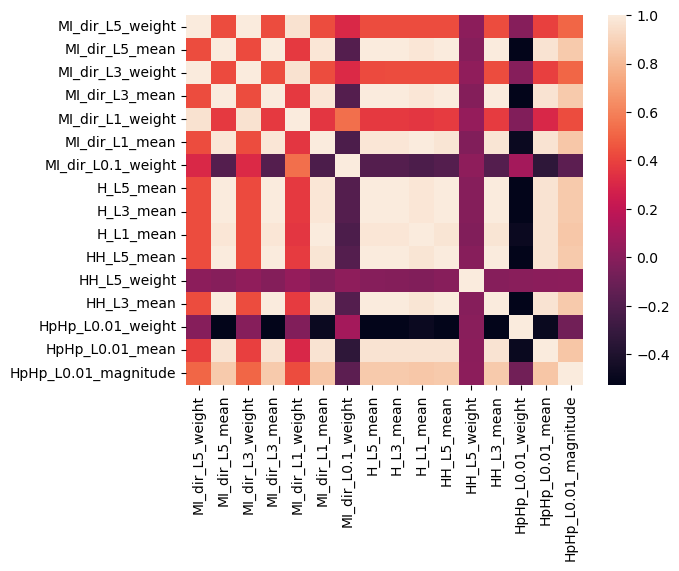

In [25]:
sns.heatmap(ed_clean.corr())

{'whiskers': [<matplotlib.lines.Line2D at 0x285e197f340>,
 'caps': [<matplotlib.lines.Line2D at 0x285e197f880>,
 'boxes': [<matplotlib.lines.Line2D at 0x285e197f0a0>,
 'medians': [<matplotlib.lines.Line2D at 0x285e197fdc0>,
 'fliers': [<matplotlib.lines.Line2D at 0x285e19b00a0>,
 'means': []}

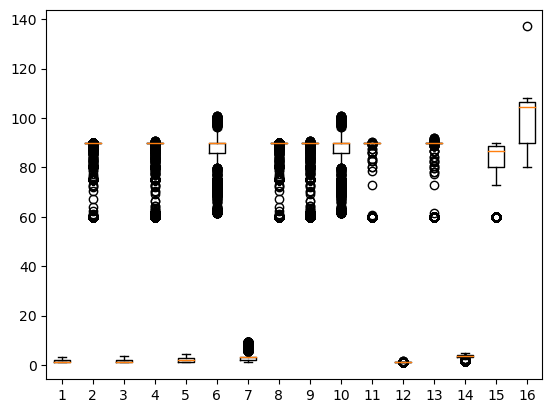

In [26]:
plt.boxplot(ed_clean)

In [27]:
ed.isnull().sum() #Checks for null values

MI_dir_L5_weight        0
MI_dir_L5_mean          0
MI_dir_L3_weight        0
MI_dir_L3_mean          0
MI_dir_L1_weight        0
MI_dir_L1_mean          0
MI_dir_L0.1_weight      0
H_L5_mean               0
H_L3_mean               0
H_L1_mean               0
HH_L5_mean              0
HH_L5_weight            0
HH_L3_mean              0
HpHp_L0.01_weight       0
HpHp_L0.01_mean         0
HpHp_L0.01_magnitude    0
dtype: int64

In [28]:
ed_clean.nunique()

MI_dir_L5_weight         6822
MI_dir_L5_mean           3312
MI_dir_L3_weight         9132
MI_dir_L3_mean           6186
MI_dir_L1_weight        11783
MI_dir_L1_mean           8470
MI_dir_L0.1_weight      22964
H_L5_mean                3312
H_L3_mean                6186
H_L1_mean                8470
HH_L5_mean               1466
HH_L5_weight             1305
HH_L3_mean               2399
HpHp_L0.01_weight       22996
HpHp_L0.01_mean         16452
HpHp_L0.01_magnitude    13805
dtype: int64

{'whiskers': [<matplotlib.lines.Line2D at 0x285e06a3b20>,
 'caps': [<matplotlib.lines.Line2D at 0x285e06d80a0>,
 'boxes': [<matplotlib.lines.Line2D at 0x285e06a3880>],
 'medians': [<matplotlib.lines.Line2D at 0x285e06d85e0>],
 'fliers': [<matplotlib.lines.Line2D at 0x285e06d8880>],
 'means': []}

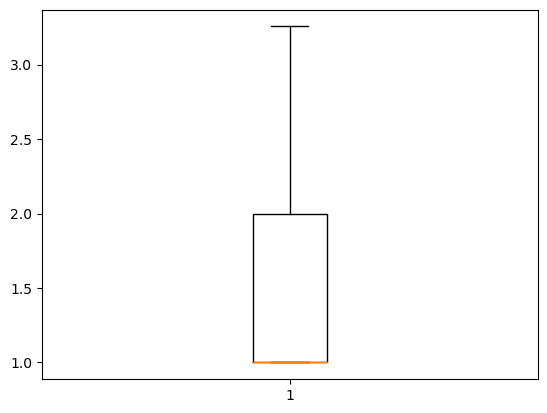

In [29]:
plt.boxplot(ed_clean["MI_dir_L5_weight"])

{'whiskers': [<matplotlib.lines.Line2D at 0x285e04d2110>,
 'caps': [<matplotlib.lines.Line2D at 0x285e04d2530>,
 'boxes': [<matplotlib.lines.Line2D at 0x285e04d1e70>],
 'medians': [<matplotlib.lines.Line2D at 0x285e04d2a70>],
 'fliers': [<matplotlib.lines.Line2D at 0x285e04d2d10>],
 'means': []}

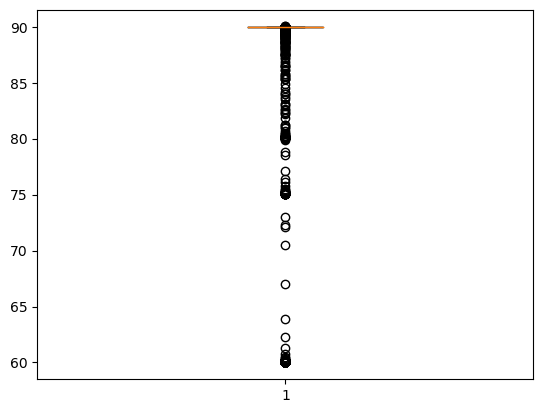

In [30]:
plt.boxplot(ed_clean["MI_dir_L5_mean"])

{'whiskers': [<matplotlib.lines.Line2D at 0x285e0550280>,
 'caps': [<matplotlib.lines.Line2D at 0x285e05519c0>,
 'boxes': [<matplotlib.lines.Line2D at 0x285e0551300>],
 'medians': [<matplotlib.lines.Line2D at 0x285e0551f00>],
 'fliers': [<matplotlib.lines.Line2D at 0x285e05521a0>],
 'means': []}

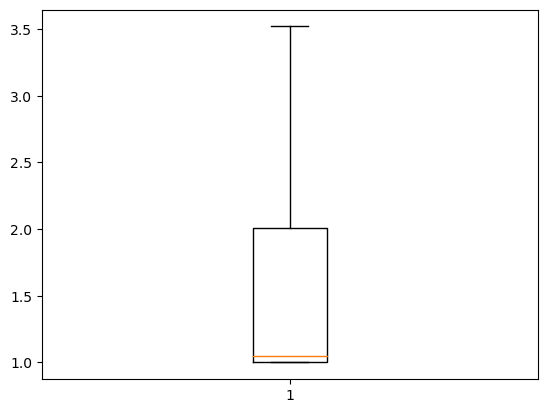

In [31]:
plt.boxplot(ed_clean["MI_dir_L3_weight"])

{'whiskers': [<matplotlib.lines.Line2D at 0x285e0710430>,
 'caps': [<matplotlib.lines.Line2D at 0x285e0710970>,
 'boxes': [<matplotlib.lines.Line2D at 0x285e0710190>],
 'medians': [<matplotlib.lines.Line2D at 0x285e0710eb0>],
 'fliers': [<matplotlib.lines.Line2D at 0x285e0711150>],
 'means': []}

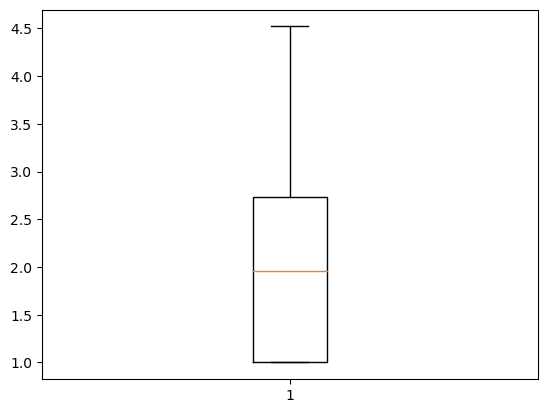

In [32]:
plt.boxplot(ed_clean["MI_dir_L1_weight"])

{'whiskers': [<matplotlib.lines.Line2D at 0x285e07901f0>,
 'caps': [<matplotlib.lines.Line2D at 0x285e0790730>,
 'boxes': [<matplotlib.lines.Line2D at 0x285e0790070>],
 'medians': [<matplotlib.lines.Line2D at 0x285e0790c70>],
 'fliers': [<matplotlib.lines.Line2D at 0x285e0790f10>],
 'means': []}

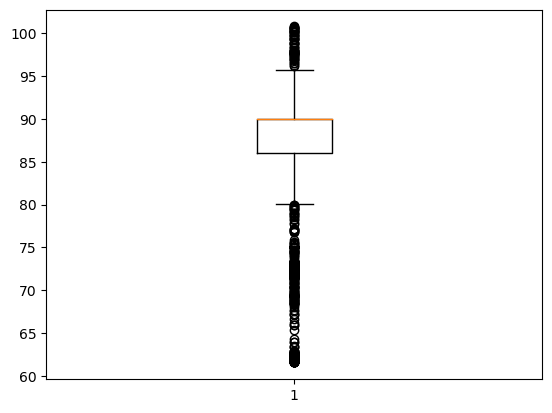

In [33]:
plt.boxplot(ed_clean["MI_dir_L1_mean"])

{'whiskers': [<matplotlib.lines.Line2D at 0x285e0800f10>,
 'caps': [<matplotlib.lines.Line2D at 0x285e0801450>,
 'boxes': [<matplotlib.lines.Line2D at 0x285e0800c70>],
 'medians': [<matplotlib.lines.Line2D at 0x285e0801990>],
 'fliers': [<matplotlib.lines.Line2D at 0x285e0801c30>],
 'means': []}

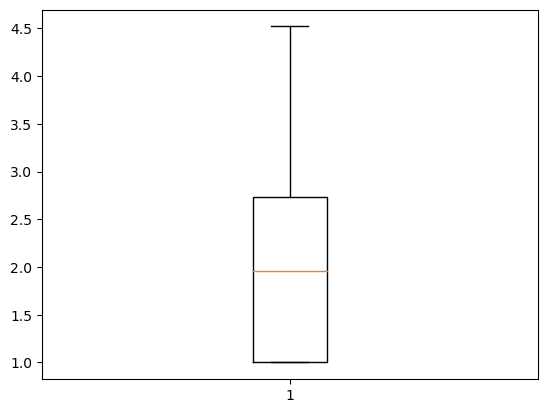

In [34]:
plt.boxplot(ed_clean["MI_dir_L1_weight"])

In [35]:
#Philips B120N10 Baby Monitor
bm = pd.read_csv("Detection of IOT Botnet Attacks/Philips_B120N10_Baby_Monitor/benign_traffic.csv")
bm

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.1_radius,HpHp_L0.1_covariance,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc
0,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000,60.000000,0.000000e+00,60.000000,0.000000e+00,0.000000e+00,0.000000e+00
1,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000,60.000000,0.000000e+00,60.000000,0.000000e+00,0.000000e+00,0.000000e+00
2,1.000000,342.000000,0.000000e+00,1.000000,342.000000,0.000000,1.000000,342.000000,0.000000,1.000000,...,1.502230e+04,0.000000e+00,0.000000e+00,6.249414,449.603272,1.229111e+02,449.603272,1.510715e+04,0.000000e+00,0.000000e+00
3,1.963325,342.000000,4.370000e-11,1.977831,342.000000,0.000000,1.992555,342.000000,0.000000,1.999253,...,1.481215e+04,0.000000e+00,0.000000e+00,7.248947,434.759286,1.200001e+02,434.759286,1.440002e+04,0.000000e+00,0.000000e+00
4,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000,60.000000,0.000000e+00,60.000000,0.000000e+00,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175235,1.000037,65.999871,7.726320e-04,1.002900,65.990542,0.056716,1.248509,65.510729,4.249763,9.413446,...,9.090000e-13,9.740000e-31,0.000000e+00,11.276682,66.000000,1.350000e-06,122.331517,5.750000e-12,-3.460000e-28,-1.100000e-16
175236,1.987500,65.999936,3.838900e-04,1.995337,65.995282,0.028314,2.245363,65.728632,2.416210,10.411071,...,3.750000e-12,-3.110000e-29,-1.710000e-17,11.276608,66.000000,1.650000e-06,122.331517,4.550000e-12,8.440000e-29,2.680000e-17
175237,2.987487,65.999957,2.553920e-04,2.995329,65.996857,0.018866,3.245360,65.812249,1.687397,11.411070,...,2.030000e-12,2.400000e-29,1.870000e-17,11.276653,66.000000,9.540000e-07,122.331517,2.030000e-12,3.910000e-29,3.040000e-17
175238,1.000335,66.000000,8.560000e-08,1.012776,65.999960,0.000238,1.526316,65.935258,0.589825,10.513158,...,7.580931e+01,-6.264246e+00,-1.201715e-01,10.786201,69.986695,6.920504e+00,100.453487,7.695840e+01,4.301015e+00,8.007406e-02


In [36]:
bm.describe()

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.1_radius,HpHp_L0.1_covariance,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc
count,175240.000000,175240.000000,1.752400e+05,175240.000000,175240.000000,1.752400e+05,175240.000000,175240.000000,175240.000000,175240.000000,...,175240.000000,1.752400e+05,1.752400e+05,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000
mean,2.061955,85.349344,3.827054e+03,2.345781,84.798908,3.978177e+03,3.383597,83.522863,4307.644137,13.292276,...,9428.087385,2.314994e+02,4.415115e-03,20.006219,81.098175,17.686433,138.345506,13924.547197,340.304039,0.059272
std,3.036577,112.139497,3.625879e+04,4.541230,107.704153,3.669703e+04,10.176459,99.890266,35960.125088,26.629416,...,55467.674798,5.328427e+03,1.625200e-01,28.178864,94.778679,48.949188,136.505636,59889.079315,5991.627609,0.182250
min,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000,1.000000,...,0.000000,-1.312975e+05,-1.586467e+00,1.000000,60.000000,0.000000,60.000000,0.000000,-182096.346200,-1.732641
25%,1.000331,66.000000,1.820000e-12,1.009940,66.000000,3.610000e-07,1.379972,66.000035,0.389357,9.599086,...,68.898158,-8.379740e-02,-1.350574e-02,18.163606,66.057859,0.891183,114.378804,187.704604,-0.024575,-0.004557
50%,1.468374,66.000000,3.430000e-05,1.723719,66.000002,1.970062e-02,2.089583,66.168159,9.962614,10.592386,...,144.385102,-2.190000e-14,-9.925000e-10,19.225143,66.845645,3.337537,115.867017,241.065262,1.928935,0.033471
75%,2.038694,66.736720,7.757729e+00,2.331578,69.451354,2.701831e+01,3.057957,72.590379,178.155936,11.777533,...,256.533613,2.574116e-01,1.502138e-02,20.229738,70.993157,18.813396,122.287938,1603.203749,11.357625,0.111060
max,79.311315,1452.697092,4.756482e+05,116.336607,1450.730015,4.714568e+05,216.475253,1434.055603,471317.502200,618.449504,...,501429.704100,1.309683e+05,1.949807e+00,748.248042,1437.325915,681.001223,1438.841936,479066.190100,131186.216600,1.953555


In [37]:
bm = bm[["MI_dir_L5_weight","MI_dir_L5_mean","MI_dir_L3_weight","MI_dir_L3_mean","MI_dir_L1_weight","MI_dir_L1_mean","MI_dir_L0.1_weight","H_L5_mean","H_L5_weight","H_L3_mean","H_L3_weight","H_L1_mean","H_L1_weight","HpHp_L0.1_pcc","HpHp_L0.01_weight","HpHp_L0.01_mean","HpHp_L0.01_magnitude"]]

{'whiskers': [<matplotlib.lines.Line2D at 0x285e08ad360>,
 'caps': [<matplotlib.lines.Line2D at 0x285e08ad8a0>,
 'boxes': [<matplotlib.lines.Line2D at 0x285e08acf10>,
 'medians': [<matplotlib.lines.Line2D at 0x285e08adde0>,
 'fliers': [<matplotlib.lines.Line2D at 0x285e08ae080>,
 'means': []}

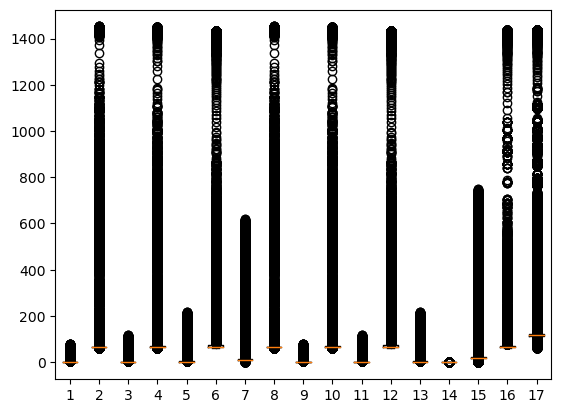

In [38]:
plt.boxplot(bm)

In [39]:
bm.describe()

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L0.1_weight,H_L5_mean,H_L5_weight,H_L3_mean,H_L3_weight,H_L1_mean,H_L1_weight,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_magnitude
count,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000,175240.000000,1.752400e+05,175240.000000,175240.000000,175240.000000
mean,2.061955,85.349344,2.345781,84.798908,3.383597,83.522863,13.292276,85.349403,2.061972,84.799084,2.345805,83.523456,3.383640,4.415115e-03,20.006219,81.098175,138.345506
std,3.036577,112.139497,4.541230,107.704153,10.176459,99.890266,26.629416,112.139635,3.036576,107.704587,4.541230,99.891923,10.176459,1.625200e-01,28.178864,94.778679,136.505636
min,1.000000,60.000000,1.000000,60.000000,1.000000,60.000000,1.000000,60.000000,1.000000,60.000000,1.000000,60.000000,1.000000,-1.586467e+00,1.000000,60.000000,60.000000
25%,1.000331,66.000000,1.009940,66.000000,1.379972,66.000035,9.599086,66.000000,1.000331,66.000000,1.009943,66.000035,1.379981,-1.350574e-02,18.163606,66.057859,114.378804
50%,1.468374,66.000000,1.723719,66.000002,2.089583,66.168159,10.592386,66.000000,1.468392,66.000002,1.723760,66.168159,2.089590,-9.925000e-10,19.225143,66.845645,115.867017
75%,2.038694,66.736720,2.331578,69.451354,3.057957,72.590379,11.777533,66.736720,2.038776,69.451354,2.331697,72.590379,3.057965,1.502138e-02,20.229738,70.993157,122.287938
max,79.311315,1452.697092,116.336607,1450.730015,216.475253,1434.055603,618.449504,1452.697092,79.311315,1450.730015,116.336607,1434.055603,216.475253,1.949807e+00,748.248042,1437.325915,1438.841936


In [40]:
z = np.abs(stats.zscore(bm))
print(z)

        MI_dir_L5_weight  MI_dir_L5_mean  MI_dir_L3_weight  MI_dir_L3_mean  \
0               0.349722        0.226053          0.296348        0.230251   
1               0.349722        0.226053          0.296348        0.230251   
2               0.349722        2.288680          0.296348        2.388040   
3               0.032481        2.288680          0.081025        2.388040   
4               0.349722        0.226053          0.296348        0.230251   
...                  ...             ...               ...             ...   
175235          0.349710        0.172549          0.295710        0.174630   
175236          0.024520        0.172548          0.077170        0.174586   
175237          0.304795        0.172548          0.143034        0.174572   
175238          0.349612        0.172548          0.293535        0.174543   
175239          0.349720        0.630022          0.296188        0.660477   

        MI_dir_L1_weight  MI_dir_L1_mean  MI_dir_L0.1_weight  H

In [41]:
threshold = 1
print(np.where(z > threshold))

(array([     2,      2,      2, ..., 175137, 175138, 175144], dtype=int64), array([ 1,  3,  5, ..., 13, 13, 13], dtype=int64))


In [42]:
bm_clean = bm[(z < threshold).all(axis=1)]

In [43]:
print(bm.shape)
print(bm_clean.shape)

(175240, 17)
(156851, 17)


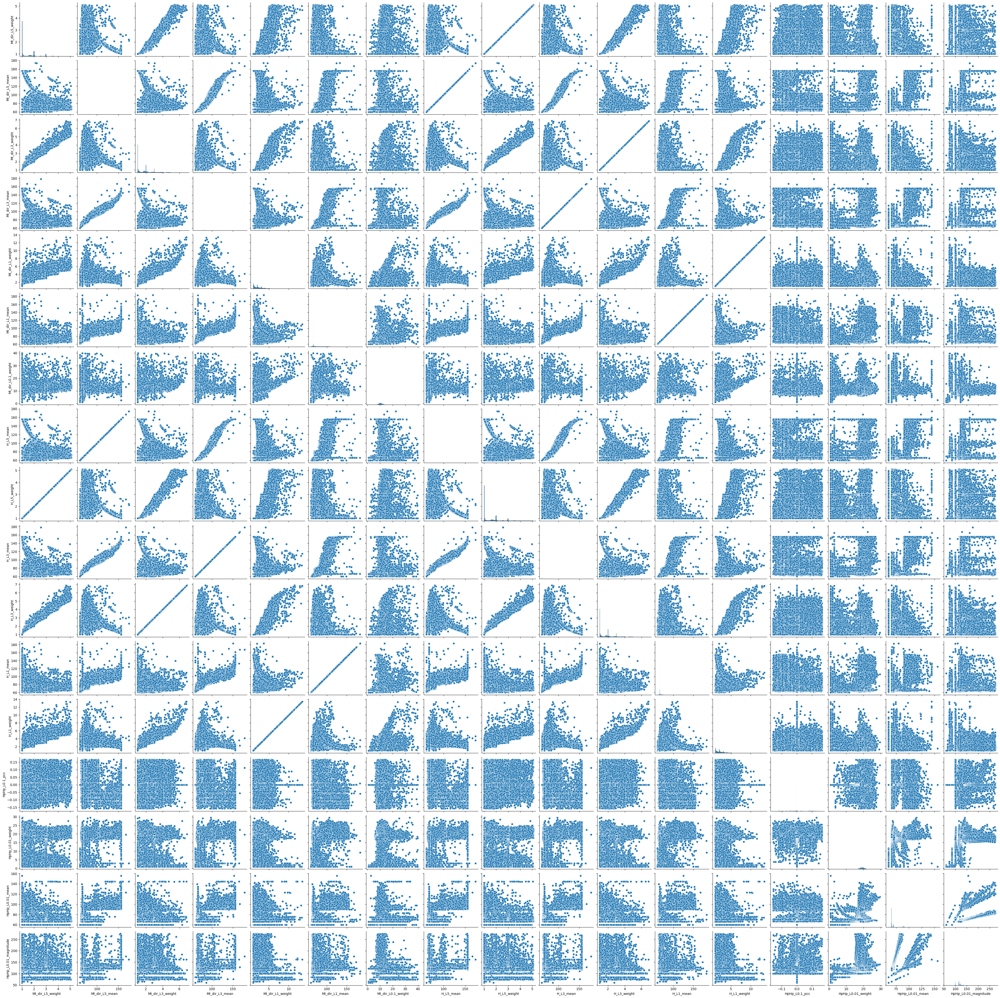

In [44]:
sns.pairplot(bm_clean)

In [45]:
bm_clean.corr() #Comparing correlations to variables

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L0.1_weight,H_L5_mean,H_L5_weight,H_L3_mean,H_L3_weight,H_L1_mean,H_L1_weight,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_magnitude
MI_dir_L5_weight,1.000000,-0.143921,0.983820,-0.146652,0.847406,-0.150134,0.372315,-0.143921,1.000000,-0.146652,0.983820,-0.150134,0.847406,0.070721,0.145163,-0.203201,0.102124
MI_dir_L5_mean,-0.143921,1.000000,-0.123598,0.995425,-0.059870,0.935088,0.021137,1.000000,-0.143921,0.995425,-0.123598,0.935088,-0.059870,-0.233204,0.065371,0.628520,0.177599
MI_dir_L3_weight,0.983820,-0.123598,1.000000,-0.127690,0.919810,-0.128286,0.436674,-0.123598,0.983820,-0.127690,1.000000,-0.128286,0.919810,0.077277,0.125353,-0.162756,0.083807
MI_dir_L3_mean,-0.146652,0.995425,-0.127690,1.000000,-0.063232,0.956161,0.023783,0.995425,-0.146652,1.000000,-0.127690,0.956161,-0.063232,-0.212151,0.061835,0.627141,0.175708
MI_dir_L1_weight,0.847406,-0.059870,0.919810,-0.063232,1.000000,-0.051026,0.602686,-0.059870,0.847406,-0.063232,0.919810,-0.051026,1.000000,0.077085,0.054977,-0.066798,0.027593
MI_dir_L1_mean,-0.150134,0.935088,-0.128286,0.956161,-0.051026,1.000000,0.077458,0.935088,-0.150134,0.956161,-0.128286,1.000000,-0.051026,-0.168090,0.042766,0.592465,0.159117
MI_dir_L0.1_weight,0.372315,0.021137,0.436674,0.023783,0.602686,0.077458,1.000000,0.021137,0.372315,0.023783,0.436674,0.077458,0.602686,0.010224,-0.050551,0.038132,-0.046740
H_L5_mean,-0.143921,1.000000,-0.123598,0.995425,-0.059870,0.935088,0.021137,1.000000,-0.143921,0.995425,-0.123598,0.935088,-0.059870,-0.233204,0.065371,0.628520,0.177599
H_L5_weight,1.000000,-0.143921,0.983820,-0.146652,0.847406,-0.150134,0.372315,-0.143921,1.000000,-0.146652,0.983820,-0.150134,0.847406,0.070721,0.145163,-0.203201,0.102124
H_L3_mean,-0.146652,0.995425,-0.127690,1.000000,-0.063232,0.956161,0.023783,0.995425,-0.146652,1.000000,-0.127690,0.956161,-0.063232,-0.212151,0.061835,0.627141,0.175708


<Axes: >

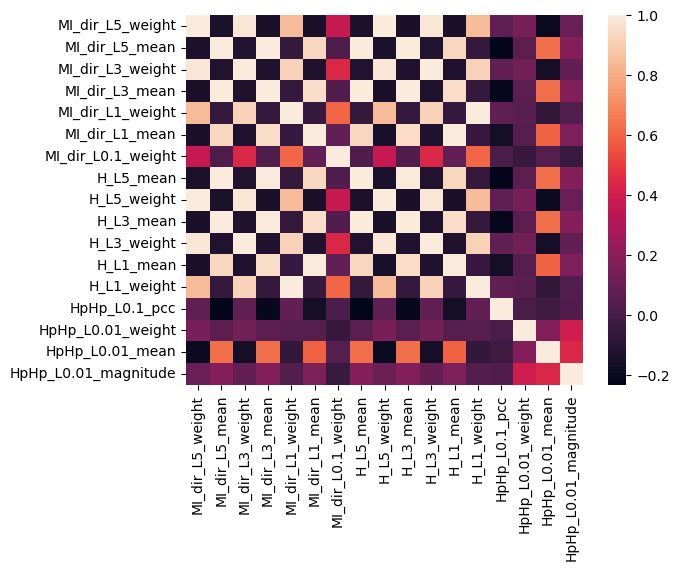

In [46]:
sns.heatmap(bm_clean.corr())

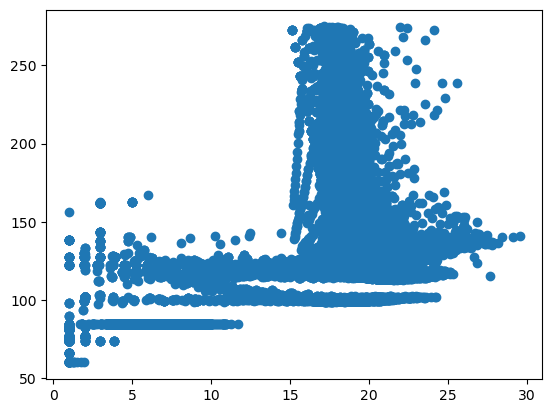

In [47]:
#Scatter plot creation
S = bm_clean[['HpHp_L0.01_weight','HpHp_L0.01_magnitude']]
plt.scatter(S['HpHp_L0.01_weight'],S['HpHp_L0.01_magnitude'])

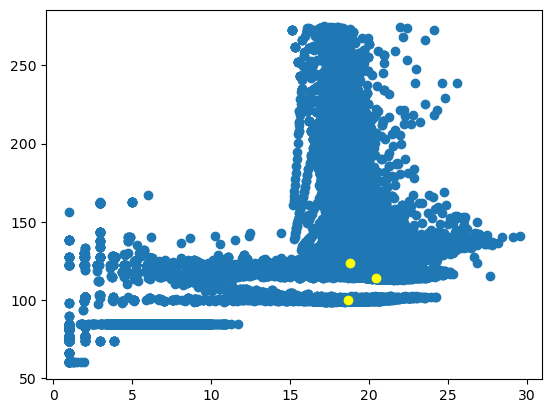

In [48]:
K=3
Centroids = (S.sample(n=K))
plt.scatter(S['HpHp_L0.01_weight'],S['HpHp_L0.01_magnitude'])
plt.scatter(Centroids['HpHp_L0.01_weight'],Centroids['HpHp_L0.01_magnitude'],c='yellow')
plt.show()

In [49]:
import numpy as np
diff = 1
j=0

while(diff!=0):
    XD=S
    i=1
    for index1,row_c in Centroids.iterrows():
        ED=[]
        for index2,row_d in XD.iterrows():
            d1=(row_c['HpHp_L0.01_weight']-row_d['HpHp_L0.01_weight'])**2
            d2=(row_c['HpHp_L0.01_magnitude']-row_d['HpHp_L0.01_magnitude'])**2
            d=np.sqrt(d1+d2)
            ED.append(d)
        S[i]=ED
        i=i+1
    C=[]
    for index,row in S.iterrows():
        min_dist=row[1]
        pos=1
        for i in range(K):
            if row[i+1] < min_dist:
                min_dist = row[i+1]
                pos=i+1
        C.append(pos)
    S["Cluster"]=C
    Centroids_new = S.groupby(["Cluster"]).mean()[['HpHp_L0.01_magnitude','HpHp_L0.01_weight']]
    if j == 0:
        diff=1
        j=j+1
    else:
        diff = (Centroids_new['HpHp_L0.01_magnitude'] - Centroids['HpHp_L0.01_magnitude']).sum() + (Centroids_new['HpHp_L0.01_weight'] - 
                                                                            Centroids['HpHp_L0.01_weight']).sum()
        print(diff.sum())
    Centroids = S.groupby(["Cluster"]).mean()[['HpHp_L0.01_magnitude','HpHp_L0.01_weight']]

C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

7.26720188944045


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


19.21298994932944


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


21.941650816057138


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


13.583209550556273


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


6.278020278171736


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


2.7141981657301635


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


1.1687211989453132


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


0.35055052553579813


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


0.2499200919142872


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


0.11860684984858239


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


0.16627301990481413


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


0.18108821065168357


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


0.075428921376826


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED
C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


0.01532059564906163


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S[i]=ED


0.0


C:\Users\marl1_22\AppData\Local\Temp\ipykernel_1100\3139687648.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S["Cluster"]=C


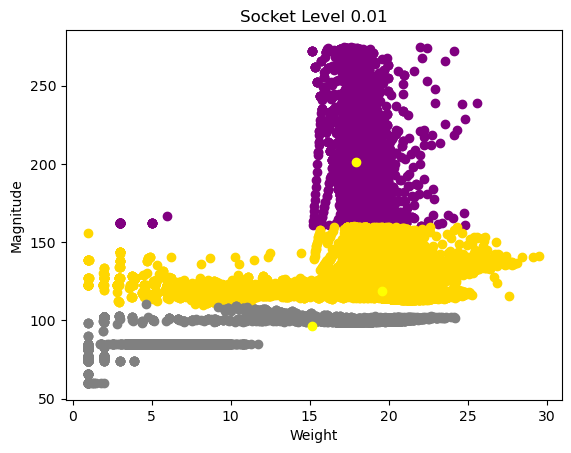

In [50]:
color=['purple','gold','grey']
for k in range(K):
    data=S[S["Cluster"]==k+1]
    plt.scatter(data['HpHp_L0.01_weight'],data['HpHp_L0.01_magnitude'],c=color[k])
plt.scatter(Centroids['HpHp_L0.01_weight'],Centroids['HpHp_L0.01_magnitude'],c='yellow')
plt.title("Socket Level 0.01")
plt.xlabel("Weight")
plt.ylabel("Magnitude")
plt.show()

In [51]:
from sklearn.preprocessing import normalize
bm_scaled = normalize(bm_clean)
bm_scaled = pd.DataFrame(bm_scaled, columns=bm_clean.columns)
bm_scaled.head()

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L0.1_weight,H_L5_mean,H_L5_weight,H_L3_mean,H_L3_weight,H_L1_mean,H_L1_weight,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_magnitude
0,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.0,0.005892,0.353504,0.353504
1,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.0,0.005892,0.353504,0.353504
2,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.0,0.005892,0.353504,0.353504
3,0.010078,0.343702,0.010116,0.343557,0.010154,0.343412,0.010171,0.343702,0.010078,0.343557,0.010116,0.343412,0.010154,0.0,0.005087,0.381489,0.381489
4,0.011616,0.349650,0.012779,0.348319,0.014146,0.347020,0.014836,0.349650,0.011616,0.348319,0.012779,0.347020,0.014146,0.0,0.004972,0.367933,0.367933


In [52]:
bm_scaled = bm_scaled.dropna()
bm_scaled

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L0.1_weight,H_L5_mean,H_L5_weight,H_L3_mean,H_L3_weight,H_L1_mean,H_L1_weight,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_magnitude
0,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.000000e+00,0.005892,0.353504,0.353504
1,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.000000e+00,0.005892,0.353504,0.353504
2,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.353504,0.005892,0.000000e+00,0.005892,0.353504,0.353504
3,0.010078,0.343702,0.010116,0.343557,0.010154,0.343412,0.010171,0.343702,0.010078,0.343557,0.010116,0.343412,0.010154,0.000000e+00,0.005087,0.381489,0.381489
4,0.011616,0.349650,0.012779,0.348319,0.014146,0.347020,0.014836,0.349650,0.011616,0.348319,0.012779,0.347020,0.014146,0.000000e+00,0.004972,0.367933,0.367933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156846,0.004686,0.309247,0.004699,0.309203,0.005850,0.306955,0.044107,0.309247,0.004686,0.309203,0.004699,0.306955,0.005850,0.000000e+00,0.052838,0.309247,0.573192
156847,0.009303,0.308918,0.009339,0.308896,0.010510,0.307648,0.048730,0.308918,0.009303,0.308896,0.009339,0.307648,0.010510,-8.003795e-20,0.052781,0.308918,0.572583
156848,0.013972,0.308664,0.014008,0.308650,0.015178,0.307786,0.053367,0.308664,0.013972,0.308650,0.014008,0.307786,0.015178,8.745492e-20,0.052738,0.308664,0.572112
156849,0.004920,0.324594,0.004981,0.324594,0.007507,0.324275,0.051705,0.324594,0.004920,0.324594,0.004981,0.324275,0.007507,-5.910139e-04,0.053047,0.344201,0.494039


{'whiskers': [<matplotlib.lines.Line2D at 0x2861c22a290>,
 'caps': [<matplotlib.lines.Line2D at 0x2861c22a980>,
 'boxes': [<matplotlib.lines.Line2D at 0x2861c22be20>],
 'medians': [<matplotlib.lines.Line2D at 0x2861c22ad40>],
 'fliers': [<matplotlib.lines.Line2D at 0x2861c22a5f0>],
 'means': []}

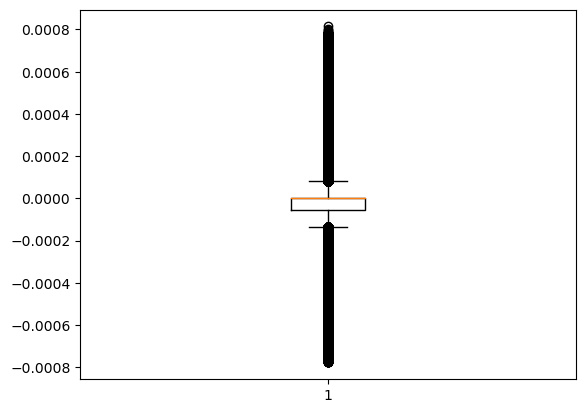

In [53]:
plt.boxplot(bm_scaled["HpHp_L0.1_pcc"])

MemoryError: Unable to allocate 91.6 GiB for an array with shape (12301039675,) and data type float64

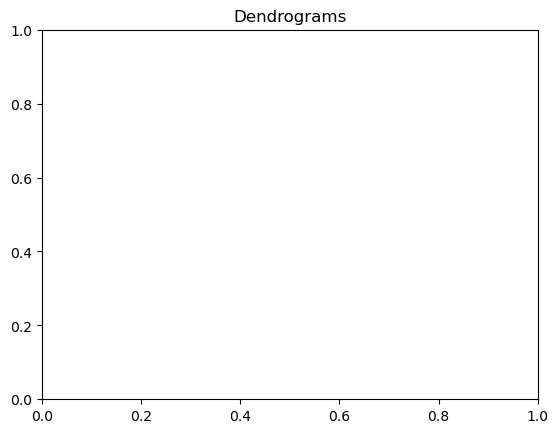

In [56]:
plt.figure()
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(bm_scaled, method='ward'))

In [1]:
#SimpleHome XCS7 1002 WHT Security Camera
sh = pd.read_csv("Detection of IOT Botnet Attacks/SimpleHome_XCS7_1002_WHT_Security_Camera/benign_traffic.csv")
sh

NameError: name 'pd' is not defined

In [ ]:
sns.pairplot(sh)

In [ ]:
z = np.abs(stats.zscore(sh))
print(z)

In [ ]:
threshold = 1
print(np.where(z > threshold))

In [ ]:
sh_clean = sh[(z < threshold).all(axis=1)]

In [ ]:
print(sh.shape)
print(sh_clean.shape)

In [ ]:
sh_clean.corr() #Comparing correlations to variables

In [ ]:
plt.boxplot(sh_clean["MI_dir_L5_weight"])

In [ ]:
plt.boxplot(sh_clean["MI_dir_L5_mean"])

It appears that for this variable, there are two outliers rather than several.

In [ ]:
plt.boxplot(sh_clean["MI_dir_L5_variance"])

In [ ]:
S = sh_clean[["MI_dir_L5_weight","MI_dir_L5_mean"]]
plt.scatter(S['MI_dir_L5_weight'],S['MI_dir_L5_mean'])
#Creating a scatter plot to go into further detail
plt.xlabel("Source MAC-IP Address")

In [ ]:
S = S.loc[(S.MI_dir_L5_weight < 1.8) & (S.MI_dir_L5_mean >80)] #Removing the outliers
plt.scatter(S['MI_dir_L5_weight'],S['MI_dir_L5_mean'])
plt.title("Source MAC-IP Address")

In [ ]:
while(diff!=0):
    XD=S
    i=1
    for index1,row_c in Centroids.iterrows():
        ED=[]
        for index2,row_d in XD.iterrows():
            d1=(row_c['MI_dir_L5_weight']-row_d['MI_dir_L5_weight'])**2
            d2=(row_c['MI_dir_L5_mean']-row_d['MI_dir_L5_mean'])**2
            d=np.sqrt(d1+d2)
            ED.append(d)
        S[i]=ED
        i=i+1
    C=[]
    for index,row in S.iterrows():
        min_dist=row[1]
        pos=1
        for i in range(K):
            if row[i+1] < min_dist:
                min_dist = row[i+1]
                pos=i+1
        C.append(pos)
    S["Cluster"]=C
    Centroids_new = S.groupby(["Cluster"]).mean()[['MI_dir_L5_mean','MI_dir_L5_weight']]
    if j == 0:
        diff=1
        j=j+1
    else:
        diff = (Centroids_new['MI_dir_L5_mean'] - Centroids['MI_dir_L5_mean']).sum() + (Centroids_new['MI_dir_L5_weight'] - 
                                                                              Centroids['MI_dir_L5_weight']).sum()
        print(diff.sum())
    Centroids = S.groupby(["Cluster"]).mean()[['MI_dir_L5_mean','MI_dir_L5_weight']]

In [ ]:
color=['red','orange','green']
for k in range(K):
    data=S[S["Cluster"]==k+1]
    plt.scatter(data['MI_dir_L5_weight'],data['MI_dir_L5_mean'],c=color[k])
plt.scatter(Centroids['MI_dir_L5_weight'],Centroids['MI_dir_L5_mean'],c='yellow')
plt.title("Source MAC-IP Level 5")
plt.xlabel("Weight")
plt.ylabel("Mean")
plt.show()

In [ ]:
#SimpleHome XCS7 1003 WHT Security Camera
sh1003 = pd.read_csv("Detection of IOT Botnet Attacks/SimpleHome_XCS7_1003_WHT_Security_Camera/benign_traffic.csv")
sh1003

In [ ]:
sh1003.describe()

In [ ]:
sns.pairplot(sh1003)

In [ ]:
plt.boxplot(sh1003["MI_dir_L5_mean"])

In [ ]:
plt.boxplot(sh1003["MI_dir_L3_mean"])

In [ ]:
plt.boxplot(sh1003["MI_dir_L1_mean"])

In [ ]:
#Comparing means
mean = sh1003[['MI_dir_L5_mean','MI_dir_L3_mean','MI_dir_L1_mean','H_L5_mean','H_L3_mean','H_L1_mean']]
sns.heatmap(mean.corr())

In [ ]:
#Comparing weights
weight = sh1003[['MI_dir_L5_weight','MI_dir_L3_weight','MI_dir_L1_weight','H_L5_weight','H_L3_weight','HpHp_L0.01_weight']]
sns.heatmap(weight.corr())

In [ ]:
#Comparing Level 5 
level5 = sh1003[['MI_dir_L5_mean', 'MI_dir_L5_weight','MI_dir_L5_variance','H_L5_mean','H_L5_weight','H_L5_variance']]
sns.heatmap(level5.corr())

In [ ]:
#Scatter plot creation
L5 = df[['MI_dir_L5_weight','MI_dir_L5_mean']]
plt.scatter(L5['MI_dir_L5_weight'],L5['MI_dir_L5_mean'])

In [ ]:
L5 = L5.loc[(L5.MI_dir_L5_mean < 100) & (L5.MI_dir_L5_weight < 7)] #Removing the outliers
plt.scatter(L5['MI_dir_L5_weight'],L5['MI_dir_L5_mean'])

In [ ]:
#
#K=3
#Centroids = (X.sample(n=K))
#plt.scatter(X["BounceRates"],X["ExitRates"])
#plt.scatter(Centroids["BounceRates"],Centroids["ExitRates"],c='red')
#plt.show()